# Prevendo Nível de Satisfação de Clientes Santander

O Objetivo do projeto é conseguir prever a probabilidade de cada cliente no dataset "teste.csv" estar ou não satisfeito.

A coluna "TARGET" dataset "train.csv" representa a coluna que queremos prever, onde 1 representa: Cliente Insatisfeito e 0 representa: Cliente Satisfeito.

O dataset pode ser obtido no Kaggle: https://www.kaggle.com/c/santander-customer-satisfaction

A - Pré-processamento
1. OK Carregar os dados;
2. OK Realizar análise exploratória das variáveis (scatter plot, box plot, correlação entre variáveis, matrix de correlação...)
3. OK Transformação de variáveis (normalização, padronização...)
4. OK Feature Selection (utilizar modelos de ML para identificar variáveis + relevantes a serem utilizadas)
5. OK Realizar o balanceamento da variável target, para que o modelo não fique Tendencioso
6. OK Redução de Dimensionalidade (quando necessário, e existir muitas variáveis...PCA é uma possível solução)

B - Aprendizado
1. OK Split Dados Treino/Teste
2. OK Seleção do modelo
3. Cross-Validation
4. Métricas de performance (Ajuste de hiper-parametros)
5. Otimização do modelo (ajuste de hiper-parametros)

C - Avaliação
1. OK Validação do modelo (utilizar dados de validação)
2. Otimização

D - Previsão
1. Passar para o modelo criado, dados que ele desconhece (dados de teste que não possuem a variavel TARGET)



In [1]:
# Importando as bibliotecas necessárias

# Biblioteca para manipulação de Dados
import pandas as pd
# Biblioteca para plot de gráficos
import matplotlib.pyplot as plt
%matplotlib inline
# 
import numpy as np

# Utilizado para realizar o balanceamento da classificação (TARGET) dos dados para evitar resultado tendêncioso
#!pip install imblearn
from imblearn.over_sampling import SMOTE

In [44]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Carregando o dataset utilizando o Pandas
dataset_train = pd.read_csv("data/train.csv", sep = ",")

In [3]:
# Visualizando os primeiros registros do dataset_train
dataset_train.head(5)

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030000,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970000,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0


In [4]:
dataset_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76020 entries, 0 to 76019
Columns: 371 entries, ID to TARGET
dtypes: float64(111), int64(260)
memory usage: 215.2 MB


In [5]:
pd.set_option('display.max_columns', None)  
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', -1)
dataset_train.describe()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var2_0,ind_var2,ind_var5_0,ind_var5,ind_var6_0,ind_var6,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13_medio_0,ind_var13_medio,ind_var13,ind_var14_0,ind_var14,ind_var17_0,ind_var17,ind_var18_0,ind_var18,ind_var19,ind_var20_0,ind_var20,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var26,ind_var25_0,ind_var25,ind_var27_0,ind_var28_0,ind_var28,ind_var27,ind_var29_0,ind_var29,ind_var30_0,ind_var30,ind_var31_0,ind_var31,ind_var32_cte,ind_var32_0,ind_var32,ind_var33_0,ind_var33,ind_var34_0,ind_var34,ind_var37_cte,ind_var37_0,ind_var37,ind_var39_0,ind_var40_0,ind_var40,ind_var41_0,ind_var41,ind_var39,ind_var44_0,ind_var44,ind_var46_0,ind_var46,num_var1_0,num_var1,num_var4,num_var5_0,num_var5,num_var6_0,num_var6,num_var8_0,num_var8,num_var12_0,num_var12,num_var13_0,num_var13_corto_0,num_var13_corto,num_var13_largo_0,num_var13_largo,num_var13_medio_0,num_var13_medio,num_var13,num_var14_0,num_var14,num_var17_0,num_var17,num_var18_0,num_var18,num_var20_0,num_var20,num_var24_0,num_var24,num_var26_0,num_var26,num_var25_0,num_var25,num_op_var40_hace2,num_op_var40_hace3,num_op_var40_ult1,num_op_var40_ult3,num_op_var41_hace2,num_op_var41_hace3,num_op_var41_ult1,num_op_var41_ult3,num_op_var39_hace2,num_op_var39_hace3,num_op_var39_ult1,num_op_var39_ult3,num_var27_0,num_var28_0,num_var28,num_var27,num_var29_0,num_var29,num_var30_0,num_var30,num_var31_0,num_var31,num_var32_0,num_var32,num_var33_0,num_var33,num_var34_0,num_var34,num_var35,num_var37_med_ult2,num_var37_0,num_var37,num_var39_0,num_var40_0,num_var40,num_var41_0,num_var41,num_var39,num_var42_0,num_var42,num_var44_0,num_var44,num_var46_0,num_var46,saldo_var1,saldo_var5,saldo_var6,saldo_var8,saldo_var12,saldo_var13_corto,saldo_var13_largo,saldo_var13_medio,saldo_var13,saldo_var14,saldo_var17,saldo_var18,saldo_var20,saldo_var24,saldo_var26,saldo_var25,saldo_var28,saldo_var27,saldo_var29,saldo_var30,saldo_var31,saldo_var32,saldo_var33,saldo_var34,saldo_var37,saldo_var40,saldo_var41,saldo_var42,saldo_var44,saldo_var46,var36,delta_imp_amort_var18_1y3,delta_imp_amort_var34_1y3,delta_imp_aport_var13_1y3,delta_imp_aport_var17_1y3,delta_imp_aport_var33_1y3,delta_imp_compra_var44_1y3,delta_imp_reemb_var13_1y3,delta_imp_reemb_var17_1y3,delta_imp_reemb_var33_1y3,delta_imp_trasp_var17_in_1y3,delta_imp_trasp_var17_out_1y3,delta_imp_trasp_var33_in_1y3,delta_imp_trasp_var33_out_1y3,delta_imp_venta_var44_1y3,delta_num_aport_var13_1y3,delta_num_aport_var17_1y3,delta_num_aport_var33_1y3,delta_num_compra_var44_1y3,delta_num_reemb_var13_1y3,delta_num_reemb_var17_1y3,delta_num_reemb_var33_1y3,delta_num_trasp_var17_in_1y3,delta_num_trasp_var17_out_1y3,delta_num_trasp_var33_in_1y3,delta_num_trasp_var33_out_1y3,delta_num_venta_var44_1y3,imp_amort_var18_hace3,imp_amort_var18_ult1,imp_amort_var34_hace3,imp_amort_var34_ult1,imp_aport_var13_hace3,imp_aport_var13_ult1,imp_aport_var17_hace3,imp_aport_var17_ult1,imp_aport_var33_hace3,imp_aport_var33_ult1,imp_var7_emit_ult1,imp_var7_recib_ult1,imp_compra_var44_hace3,imp_compra_var44_ult1,imp_reemb_var13_hace3,imp_reemb_var13_ult1,imp_reemb_var17_hace3,imp_reemb_var17_ult1,imp_reemb_var33_hace3,imp_reemb_var33_ult1,imp_var43_emit_ult1,imp_trans_var37_ult1,imp_trasp_var17_in_hace3,imp_trasp_var17_in_ult1,imp_trasp_var17_out_hace3,imp_trasp_var17_out_ult1,imp_trasp_var33_in_hace3,imp_trasp_var33_in_ult1,imp_trasp_var33_out_hace3,imp_trasp_var33_out_ult1,imp_venta_var44_hace3,imp_venta_var44_ult1,ind_var7_emit_ult1,ind_var7_recib_ult1,ind_var10_ult1,ind_var10

### Realizando a Limpeza de alguns dados identificados como "suspeitos" ou desnecessários

In [6]:
def CleanData(dataset):
    # Removendo colunas que possuem somentes valores = 0 (irrelevantes para o modelo)
    dataset = dataset.loc[:, (dataset !=0).any(axis=0)]
    
    # Variável var3 apresenta um valor Min muito disperso com base no describe acima podendo representar valores unknown. 
    # Realizando o ajuste da variável aplicando o valor encontrado na mediana.
    dataset = dataset.replace({'var3': -999999}, 2)
    
    return dataset

In [8]:
dataset_train = CleanData(dataset_train)
dataset_train.describe()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var5_0,ind_var5,ind_var6_0,ind_var6,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13_medio_0,ind_var13_medio,ind_var13,ind_var14_0,ind_var14,ind_var17_0,ind_var17,ind_var18_0,ind_var18,ind_var19,ind_var20_0,ind_var20,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var26,ind_var25_0,ind_var25,ind_var29_0,ind_var29,ind_var30_0,ind_var30,ind_var31_0,ind_var31,ind_var32_cte,ind_var32_0,ind_var32,ind_var33_0,ind_var33,ind_var34_0,ind_var34,ind_var37_cte,ind_var37_0,ind_var37,ind_var39_0,ind_var40_0,ind_var40,ind_var41_0,ind_var39,ind_var44_0,ind_var44,num_var1_0,num_var1,num_var4,num_var5_0,num_var5,num_var6_0,num_var6,num_var8_0,num_var8,num_var12_0,num_var12,num_var13_0,num_var13_corto_0,num_var13_corto,num_var13_largo_0,num_var13_largo,num_var13_medio_0,num_var13_medio,num_var13,num_var14_0,num_var14,num_var17_0,num_var17,num_var18_0,num_var18,num_var20_0,num_var20,num_var24_0,num_var24,num_var26_0,num_var26,num_var25_0,num_var25,num_op_var40_hace2,num_op_var40_hace3,num_op_var40_ult1,num_op_var40_ult3,num_op_var41_hace2,num_op_var41_hace3,num_op_var41_ult1,num_op_var41_ult3,num_op_var39_hace2,num_op_var39_hace3,num_op_var39_ult1,num_op_var39_ult3,num_var29_0,num_var29,num_var30_0,num_var30,num_var31_0,num_var31,num_var32_0,num_var32,num_var33_0,num_var33,num_var34_0,num_var34,num_var35,num_var37_med_ult2,num_var37_0,num_var37,num_var39_0,num_var40_0,num_var40,num_var41_0,num_var39,num_var42_0,num_var42,num_var44_0,num_var44,saldo_var1,saldo_var5,saldo_var6,saldo_var8,saldo_var12,saldo_var13_corto,saldo_var13_largo,saldo_var13_medio,saldo_var13,saldo_var14,saldo_var17,saldo_var18,saldo_var20,saldo_var24,saldo_var26,saldo_var25,saldo_var29,saldo_var30,saldo_var31,saldo_var32,saldo_var33,saldo_var34,saldo_var37,saldo_var40,saldo_var42,saldo_var44,var36,delta_imp_amort_var18_1y3,delta_imp_amort_var34_1y3,delta_imp_aport_var13_1y3,delta_imp_aport_var17_1y3,delta_imp_aport_var33_1y3,delta_imp_compra_var44_1y3,delta_imp_reemb_var13_1y3,delta_imp_reemb_var17_1y3,delta_imp_reemb_var33_1y3,delta_imp_trasp_var17_in_1y3,delta_imp_trasp_var17_out_1y3,delta_imp_trasp_var33_in_1y3,delta_imp_trasp_var33_out_1y3,delta_imp_venta_var44_1y3,delta_num_aport_var13_1y3,delta_num_aport_var17_1y3,delta_num_aport_var33_1y3,delta_num_compra_var44_1y3,delta_num_reemb_var13_1y3,delta_num_reemb_var17_1y3,delta_num_reemb_var33_1y3,delta_num_trasp_var17_in_1y3,delta_num_trasp_var17_out_1y3,delta_num_trasp_var33_in_1y3,delta_num_trasp_var33_out_1y3,delta_num_venta_var44_1y3,imp_amort_var18_ult1,imp_amort_var34_ult1,imp_aport_var13_hace3,imp_aport_var13_ult1,imp_aport_var17_hace3,imp_aport_var17_ult1,imp_aport_var33_hace3,imp_aport_var33_ult1,imp_var7_emit_ult1,imp_var7_recib_ult1,imp_compra_var44_hace3,imp_compra_var44_ult1,imp_reemb_var13_ult1,imp_reemb_var17_hace3,imp_reemb_var17_ult1,imp_reemb_var33_ult1,imp_var43_emit_ult1,imp_trans_var37_ult1,imp_trasp_var17_in_hace3,imp_trasp_var17_in_ult1,imp_trasp_var17_out_ult1,imp_trasp_var33_in_hace3,imp_trasp_var33_in_ult1,imp_trasp_var33_out_ult1,imp_venta_var44_hace3,imp_venta_var44_ult1,ind_var7_emit_ult1,ind_var7_recib_ult1,ind_var10_ult1,ind_var10cte_ult1,ind_var9_cte_ult1,ind_var9_ult1,ind_var43_emit_ult1,ind_var43_recib_ult1,var21,num_aport_var13_hace3,num_aport_var13_ult1,num_aport_var17_hace3,num_aport_var17_ult1,num_aport_var33_hace3,num_aport_var33_ult1,num_var7_emit_ult1,num_var7_recib_ult1,num_compra_var44_hace3,num_compra_var44_ult1,num_ent_var16_ult1,num_var22_hace2,num_var22_hace3,num_var2

In [9]:
# Verificando se existem valores NULL
dataset_train.isnull().values.any()

False

In [10]:
# Separando a coluna ID do dataset e controlando em outro dataset.
dataset_train_ID = dataset_train[['ID']]
dataset_train = dataset_train.drop(['ID'], axis=1)

### Análise Exploratória dos Dados
###### Dataset possui muitas variáveis, desse modo não serão gerados gráficos para análise exploratória de todas variáveis.
###### Analisando a distribuição da variável TARGET (que queremos prever). 

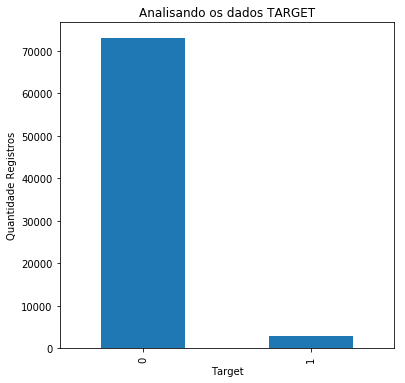

In [11]:
dataset_train['TARGET'].value_counts().plot(kind = 'bar', figsize=(6,6))
plt.title('Analisando os dados TARGET')
plt.xlabel('Target')
plt.ylabel('Quantidade Registros')
plt.show()

In [12]:
dataset_train.groupby('TARGET').size()

TARGET
0    73012
1    3008 
dtype: int64

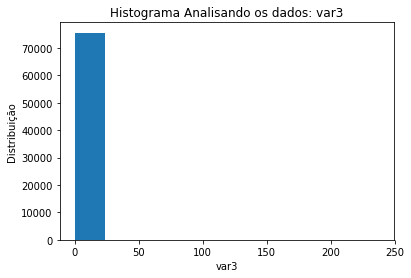

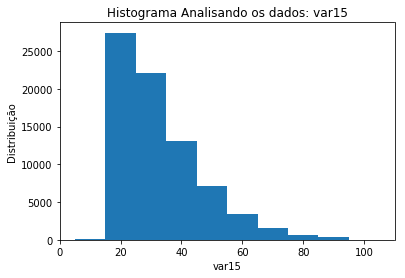

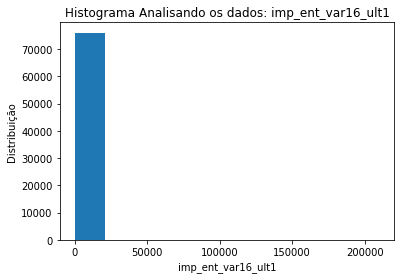

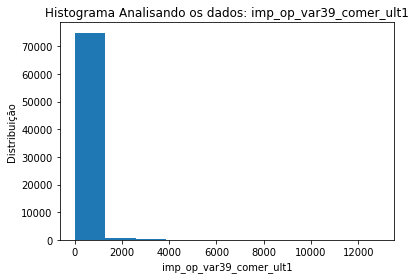

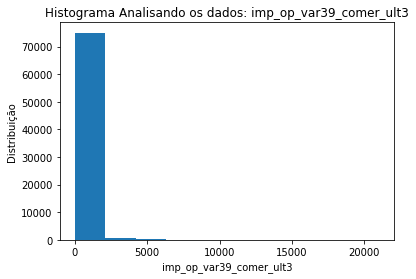

...

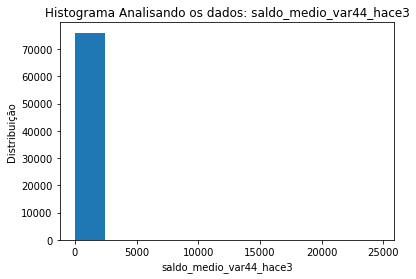

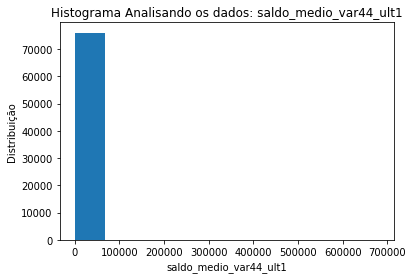

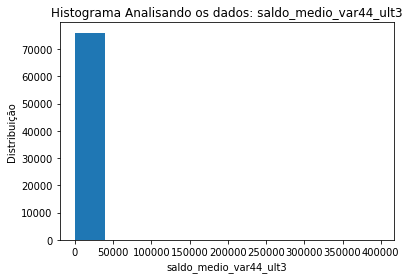

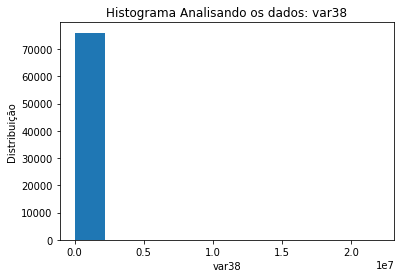

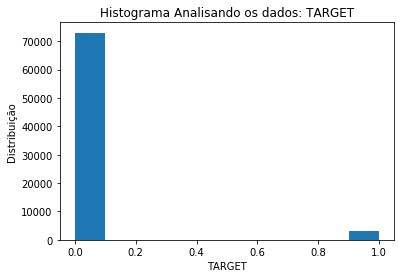

In [42]:
columns = dataset_train.columns

for i in columns:
    dataset_train[i].plot(kind = 'hist')
    plt.title('Histograma Analisando os dados: ' + i)
    plt.xlabel(i)
    plt.ylabel('Distribuição')
    
    plt.show()
    

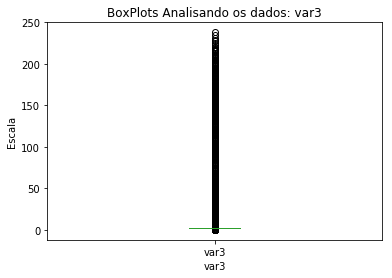

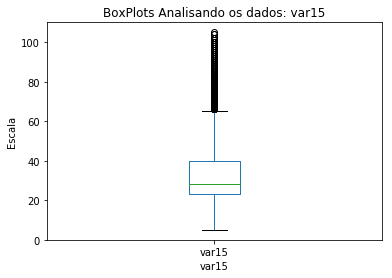

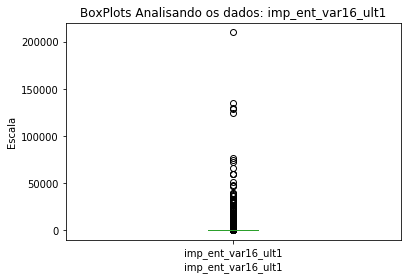

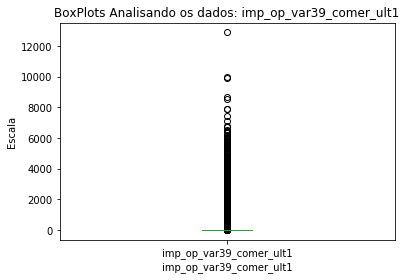

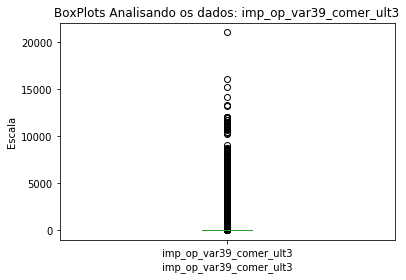

...

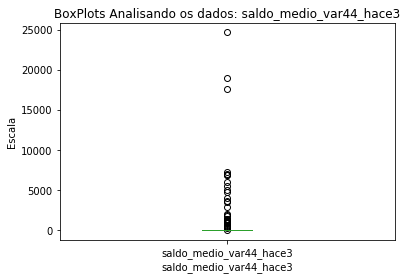

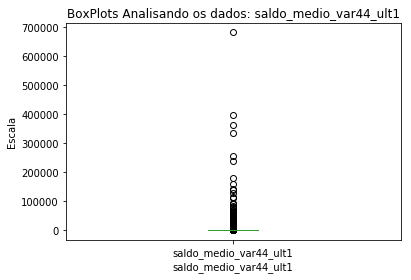

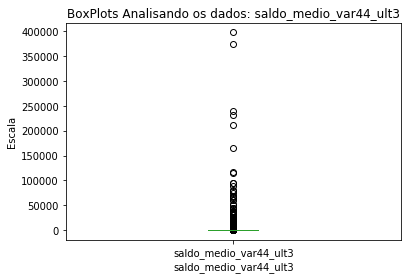

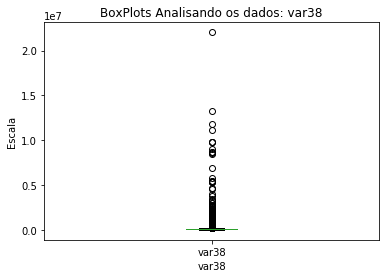

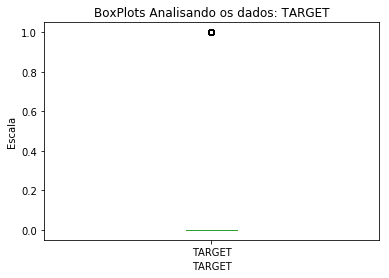

In [43]:
columns = dataset_train.columns

for i in columns:
    dataset_train[i].plot(kind = 'box')
    plt.title('BoxPlots Analisando os dados: ' + i)
    plt.xlabel(i)
    plt.ylabel('Escala')
    
    plt.show()

### Verificando a Correlação entre os dados com a variável TARGET

In [ ]:
# Criando uma Matrix de Correlação para identificar a correlação entre as variáveis
correlations = dataset_train.corr()

fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin = -1, vmax = 1) #Mostrar as correlações
fig.colorbar(cax)
plt.show()

In [ ]:
dataset_train.corr()['TARGET']

## Padronização dos Dados
###### Colocando todos os dados (Exceto a variável TARGET) na mesma escala.

In [14]:
def NormalizingData(dataset):
    normalized_vars = (dataset.drop(['TARGET'], axis=1) - dataset.drop(['TARGET'], axis=1).mean())/dataset.drop(['TARGET'], axis=1).std()

    df_normalized = pd.concat([ dataset[['TARGET']], normalized_vars], axis=1)
    
    return df_normalized

In [15]:
dataset_train_Normalized = NormalizingData(dataset_train)
dataset_train_Normalized.head(5)

,TARGET,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var5_0,ind_var5,ind_var6_0,ind_var6,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13_medio_0,ind_var13_medio,ind_var13,ind_var14_0,ind_var14,ind_var17_0,ind_var17,ind_var18_0,ind_var18,ind_var19,ind_var20_0,ind_var20,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var26,ind_var25_0,ind_var25,ind_var29_0,ind_var29,ind_var30_0,ind_var30,ind_var31_0,ind_var31,ind_var32_cte,ind_var32_0,ind_var32,ind_var33_0,ind_var33,ind_var34_0,ind_var34,ind_var37_cte,ind_var37_0,ind_var37,ind_var39_0,ind_var40_0,ind_var40,ind_var41_0,ind_var39,ind_var44_0,ind_var44,num_var1_0,num_var1,num_var4,num_var5_0,num_var5,num_var6_0,num_var6,num_var8_0,num_var8,num_var12_0,num_var12,num_var13_0,num_var13_corto_0,num_var13_corto,num_var13_largo_0,num_var13_largo,num_var13_medio_0,num_var13_medio,num_var13,num_var14_0,num_var14,num_var17_0,num_var17,num_var18_0,num_var18,num_var20_0,num_var20,num_var24_0,num_var24,num_var26_0,num_var26,num_var25_0,num_var25,num_op_var40_hace2,num_op_var40_hace3,num_op_var40_ult1,num_op_var40_ult3,num_op_var41_hace2,num_op_var41_hace3,num_op_var41_ult1,num_op_var41_ult3,num_op_var39_hace2,num_op_var39_hace3,num_op_var39_ult1,num_op_var39_ult3,num_var29_0,num_var29,num_var30_0,num_var30,num_var31_0,num_var31,num_var32_0,num_var32,num_var33_0,num_var33,num_var34_0,num_var34,num_var35,num_var37_med_ult2,num_var37_0,num_var37,num_var39_0,num_var40_0,num_var40,num_var41_0,num_var39,num_var42_0,num_var42,num_var44_0,num_var44,saldo_var1,saldo_var5,saldo_var6,saldo_var8,saldo_var12,saldo_var13_corto,saldo_var13_largo,saldo_var13_medio,saldo_var13,saldo_var14,saldo_var17,saldo_var18,saldo_var20,saldo_var24,saldo_var26,saldo_var25,saldo_var29,saldo_var30,saldo_var31,saldo_var32,saldo_var33,saldo_var34,saldo_var37,saldo_var40,saldo_var42,saldo_var44,var36,delta_imp_amort_var18_1y3,delta_imp_amort_var34_1y3,delta_imp_aport_var13_1y3,delta_imp_aport_var17_1y3,delta_imp_aport_var33_1y3,delta_imp_compra_var44_1y3,delta_imp_reemb_var13_1y3,delta_imp_reemb_var17_1y3,delta_imp_reemb_var33_1y3,delta_imp_trasp_var17_in_1y3,delta_imp_trasp_var17_out_1y3,delta_imp_trasp_var33_in_1y3,delta_imp_trasp_var33_out_1y3,delta_imp_venta_var44_1y3,delta_num_aport_var13_1y3,delta_num_aport_var17_1y3,delta_num_aport_var33_1y3,delta_num_compra_var44_1y3,delta_num_reemb_var13_1y3,delta_num_reemb_var17_1y3,delta_num_reemb_var33_1y3,delta_num_trasp_var17_in_1y3,delta_num_trasp_var17_out_1y3,delta_num_trasp_var33_in_1y3,delta_num_trasp_var33_out_1y3,delta_num_venta_var44_1y3,imp_amort_var18_ult1,imp_amort_var34_ult1,imp_aport_var13_hace3,imp_aport_var13_ult1,imp_aport_var17_hace3,imp_aport_var17_ult1,imp_aport_var33_hace3,imp_aport_var33_ult1,imp_var7_emit_ult1,imp_var7_recib_ult1,imp_compra_var44_hace3,imp_compra_var44_ult1,imp_reemb_var13_ult1,imp_reemb_var17_hace3,imp_reemb_var17_ult1,imp_reemb_var33_ult1,imp_var43_emit_ult1,imp_trans_var37_ult1,imp_trasp_var17_in_hace3,imp_trasp_var17_in_ult1,imp_trasp_var17_out_ult1,imp_trasp_var33_in_hace3,imp_trasp_var33_in_ult1,imp_trasp_var33_out_ult1,imp_venta_var44_hace3,imp_venta_var44_ult1,ind_var7_emit_ult1,ind_var7_recib_ult1,ind_var10_ult1,ind_var10cte_ult1,ind_var9_cte_ult1,ind_var9_ult1,ind_var43_emit_ult1,ind_var43_recib_ult1,var21,num_aport_var13_hace3,num_aport_var13_ult1,num_aport_var17_hace3,num_aport_var17_ult1,num_aport_var33_hace3,num_aport_var33_ult1,num_var7_emit_ult1,num_var7_recib_ult1,num_compra_var44_hace3,num_compra_var44_ult1,num_ent_var16_ult1,num_var22_hace2,num_var22_hace3,num_

# Realizando o balanceamento dos dados de Classificação utilizando SMOTE
###### A classificação dos dados está tendênciosa (Existem mais de uma classificação que outra) . É necessário aplicar o balanceamento para que o algoritmo não aprenda mais uma classificação que a outra.
###### Será necessário realizar um SMOTTE sobre os dados, para nivelar o resultado para o modelo não se tornar Tendêncioso.

In [17]:
def fun_BalancingData(dataset, var_target):
    
    # Split da variavel target e variaveis preditoras
    x_train = dataset.drop([var_target], axis=1)
    y_train = dataset[var_target]
    
    smt = SMOTE()
    
    # Separando os dados em features e target
    features_train, target_train = smt.fit_sample(x_train, y_train)
    
    target_train_DF = pd.DataFrame(target_train)
    # atribuindo o nome da coluna
    target_train_DF.columns = ['TARGET']
    
    features_train_DF = pd.DataFrame(features_train)
    features_train_DF.columns = x_train.columns
    
    return pd.concat( [target_train_DF, features_train_DF], axis=1 )

In [18]:
dataset_train_Balanced = fun_BalancingData(dataset_train_Normalized, 'TARGET')

,TARGET,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,imp_op_var41_comer_ult1,imp_op_var41_comer_ult3,imp_op_var41_efect_ult1,imp_op_var41_efect_ult3,imp_op_var41_ult1,imp_op_var39_efect_ult1,imp_op_var39_efect_ult3,imp_op_var39_ult1,imp_sal_var16_ult1,ind_var1_0,ind_var1,ind_var5_0,ind_var5,ind_var6_0,ind_var6,ind_var8_0,ind_var8,ind_var12_0,ind_var12,ind_var13_0,ind_var13_corto_0,ind_var13_corto,ind_var13_largo_0,ind_var13_largo,ind_var13_medio_0,ind_var13_medio,ind_var13,ind_var14_0,ind_var14,ind_var17_0,ind_var17,ind_var18_0,ind_var18,ind_var19,ind_var20_0,ind_var20,ind_var24_0,ind_var24,ind_var25_cte,ind_var26_0,ind_var26_cte,ind_var26,ind_var25_0,ind_var25,ind_var29_0,ind_var29,ind_var30_0,ind_var30,ind_var31_0,ind_var31,ind_var32_cte,ind_var32_0,ind_var32,ind_var33_0,ind_var33,ind_var34_0,ind_var34,ind_var37_cte,ind_var37_0,ind_var37,ind_var39_0,ind_var40_0,ind_var40,ind_var41_0,ind_var39,ind_var44_0,ind_var44,num_var1_0,num_var1,num_var4,num_var5_0,num_var5,num_var6_0,num_var6,num_var8_0,num_var8,num_var12_0,num_var12,num_var13_0,num_var13_corto_0,num_var13_corto,num_var13_largo_0,num_var13_largo,num_var13_medio_0,num_var13_medio,num_var13,num_var14_0,num_var14,num_var17_0,num_var17,num_var18_0,num_var18,num_var20_0,num_var20,num_var24_0,num_var24,num_var26_0,num_var26,num_var25_0,num_var25,num_op_var40_hace2,num_op_var40_hace3,num_op_var40_ult1,num_op_var40_ult3,num_op_var41_hace2,num_op_var41_hace3,num_op_var41_ult1,num_op_var41_ult3,num_op_var39_hace2,num_op_var39_hace3,num_op_var39_ult1,num_op_var39_ult3,num_var29_0,num_var29,num_var30_0,num_var30,num_var31_0,num_var31,num_var32_0,num_var32,num_var33_0,num_var33,num_var34_0,num_var34,num_var35,num_var37_med_ult2,num_var37_0,num_var37,num_var39_0,num_var40_0,num_var40,num_var41_0,num_var39,num_var42_0,num_var42,num_var44_0,num_var44,saldo_var1,saldo_var5,saldo_var6,saldo_var8,saldo_var12,saldo_var13_corto,saldo_var13_largo,saldo_var13_medio,saldo_var13,saldo_var14,saldo_var17,saldo_var18,saldo_var20,saldo_var24,saldo_var26,saldo_var25,saldo_var29,saldo_var30,saldo_var31,saldo_var32,saldo_var33,saldo_var34,saldo_var37,saldo_var40,saldo_var42,saldo_var44,var36,delta_imp_amort_var18_1y3,delta_imp_amort_var34_1y3,delta_imp_aport_var13_1y3,delta_imp_aport_var17_1y3,delta_imp_aport_var33_1y3,delta_imp_compra_var44_1y3,delta_imp_reemb_var13_1y3,delta_imp_reemb_var17_1y3,delta_imp_reemb_var33_1y3,delta_imp_trasp_var17_in_1y3,delta_imp_trasp_var17_out_1y3,delta_imp_trasp_var33_in_1y3,delta_imp_trasp_var33_out_1y3,delta_imp_venta_var44_1y3,delta_num_aport_var13_1y3,delta_num_aport_var17_1y3,delta_num_aport_var33_1y3,delta_num_compra_var44_1y3,delta_num_reemb_var13_1y3,delta_num_reemb_var17_1y3,delta_num_reemb_var33_1y3,delta_num_trasp_var17_in_1y3,delta_num_trasp_var17_out_1y3,delta_num_trasp_var33_in_1y3,delta_num_trasp_var33_out_1y3,delta_num_venta_var44_1y3,imp_amort_var18_ult1,imp_amort_var34_ult1,imp_aport_var13_hace3,imp_aport_var13_ult1,imp_aport_var17_hace3,imp_aport_var17_ult1,imp_aport_var33_hace3,imp_aport_var33_ult1,imp_var7_emit_ult1,imp_var7_recib_ult1,imp_compra_var44_hace3,imp_compra_var44_ult1,imp_reemb_var13_ult1,imp_reemb_var17_hace3,imp_reemb_var17_ult1,imp_reemb_var33_ult1,imp_var43_emit_ult1,imp_trans_var37_ult1,imp_trasp_var17_in_hace3,imp_trasp_var17_in_ult1,imp_trasp_var17_out_ult1,imp_trasp_var33_in_hace3,imp_trasp_var33_in_ult1,imp_trasp_var33_out_ult1,imp_venta_var44_hace3,imp_venta_var44_ult1,ind_var7_emit_ult1,ind_var7_recib_ult1,ind_var10_ult1,ind_var10cte_ult1,ind_var9_cte_ult1,ind_var9_ult1,ind_var43_emit_ult1,ind_var43_recib_ult1,var21,num_aport_var13_hace3,num_aport_var13_ult1,num_aport_var17_hace3,num_aport_var17_ult1,num_aport_var33_hace3,num_aport_var33_ult1,num_var7_emit_ult1,num_var7_recib_ult1,num_compra_var44_hace3,num_compra_var44_ult1,num_ent_var16_ult1,num_var22_hace2,num_var22_hace3,num_

# Feature Selections 
###### Analisando as variáveis mais importantes através de um gráfico

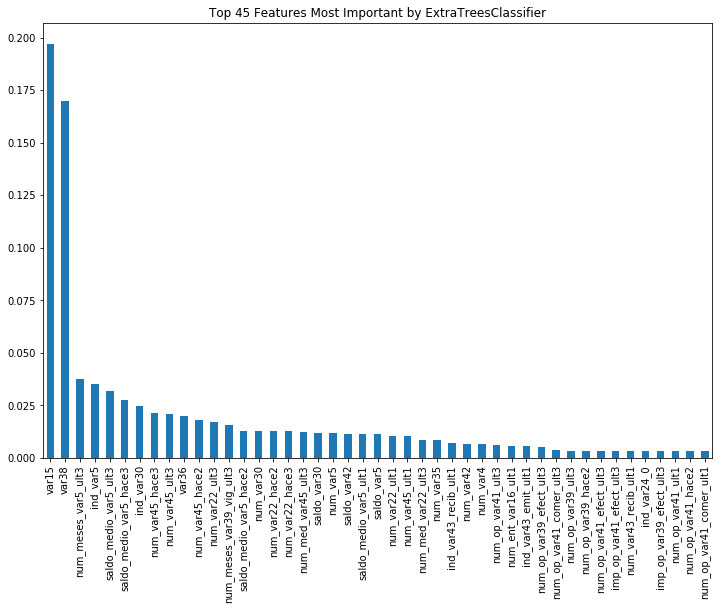

In [45]:
from sklearn.ensemble import ExtraTreesClassifier

# Atribuindo a quantidade de variáveis que desejamos selecionar, para reaproveitamento do valor em códigos futuros
n_varsImportants = 45

array_dataset = dataset_train_Balanced.values

features_x = array_dataset[:,1:] # Seleciona todas as variáveis preditoras
target_y = array_dataset[:,0:1] # Seleciona somente a TARGET

model = ExtraTreesClassifier()
seletor = model.fit(features_x,target_y.ravel())

# Trasnsformando em valor serial para plotar no gráfico
features_important = pd.Series(model.feature_importances_, index= dataset_train.drop(['TARGET'], axis=1).columns.values).sort_values(ascending=False)

features_important[:n_varsImportants].plot(kind='bar',title='Top 45 Features Most Important by ExtraTreesClassifier',figsize=(12,8))
plt.show()

In [22]:
# Função utilizada para aplicar a seleção das N variáveis mais relevantes de acordo com o ExtraTreesClassifier
def Select_Top_Features(DF, IndexColNames):
    DF_feature = DF.loc[:, DF.columns.isin(IndexColNames)]
    
    return pd.concat( [DF['TARGET'], DF_feature], axis=1 )

In [23]:
Columns_Feature_Select = features_important[:n_varsImportants].index

dataset_train_feature_selection = Select_Top_Features(dataset_train_Balanced, Columns_Feature_Select)

In [24]:
dataset_train_feature_selection.describe()

,TARGET,var15,ind_var5,ind_var30,num_var4,num_op_var41_hace2,num_op_var41_ult1,num_op_var41_ult3,num_op_var39_hace2,num_op_var39_ult3,num_var30,num_var35,num_var42,saldo_var5,saldo_var30,saldo_var42,var36,ind_var43_emit_ult1,ind_var43_recib_ult1,num_ent_var16_ult1,num_var22_hace2,num_var22_hace3,num_var22_ult1,num_var22_ult3,num_med_var22_ult3,num_med_var45_ult3,num_meses_var5_ult3,num_meses_var13_corto_ult3,num_meses_var39_vig_ult3,num_op_var39_comer_ult1,num_op_var41_comer_ult1,num_op_var41_comer_ult3,num_op_var41_efect_ult1,num_op_var41_efect_ult3,num_op_var39_efect_ult1,num_op_var39_efect_ult3,num_var43_recib_ult1,num_var45_hace2,num_var45_hace3,num_var45_ult1,num_var45_ult3,saldo_medio_var5_hace2,saldo_medio_var5_hace3,saldo_medio_var5_ult1,saldo_medio_var5_ult3,var38
count,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000,146024.000000
mean,0.500000,0.234569,-0.318186,-0.352353,-0.198620,0.001515,0.007842,0.004756,0.000680,0.004608,-0.327778,-0.193341,-0.319568,-0.037122,-0.090041,-0.060467,0.245850,-0.030393,-0.063093,-0.002036,0.008577,-0.025195,0.039028,0.004754,0.013444,-0.024224,-0.348264,-0.081641,-0.024078,-0.003761,-0.002758,-0.005957,0.032554,0.026490,0.034132,0.027769,-0.050498,-0.028101,-0.036908,-0.007292,-0.026930,-0.050611,-0.040069,-0.040688,-0.048769,-0.049539
std,0.500002,0.971850,1.054772,1.114952,1.066295,0.973823,1.017862,0.999407,0.971211,0.998589,1.030268,1.052676,1.054618,0.751498,0.751872,0.743410,1.017035,0.914541,0.903149,0.958289,1.017075,0.918963,1.114428,1.034331,1.041724,0.969188,1.067039,0.768791,1.039221,0.976345,0.984141,0.958289,1.083330,1.061054,1.091215,1.067241,0.790321,0.966848,0.947155,0.991097,0.969130,0.744737,0.729671,0.740893,0.744569,0.806683
min,0.000000,-2.177509,-1.405004,-1.656185,-1.186764,-0.218676,-0.262609,-0.269593,-0.219417,-0.269692,-1.450507,-1.150321,-1.480931,-0.398308,-0.295520,-0.246900,-0.854028,-0.267090,-0.385370,-0.188905,-0.376405,-0.363091,-0.266419,-0.490522,-0.346474,-0.368211,-1.524322,-0.203515,-2.213272,-0.240356,-0.240901,-0.244843,-0.224047,-0.234896,-0.223754,-0.234666,-0.229082,-0.372046,-0.373856,-0.302884,-0.409894,-0.140553,-0.090954,-0.207973,-0.186195,-0.613540
25%,0.000000,-0.633881,-1.405004,-1.656185,-1.186764,-0.218676,-0.262609,-0.269593,-0.219417,-0.269692,-1.450507,-1.150321,-1.480931,-0.104390,-0.217089,-0.146336,-0.811801,-0.267090,-0.385370,-0.188905,-0.376405,-0.363091,-0.266419,-0.490522,-0.346474,-0.368211,-1.524322,-0.203515,-0.823716,-0.240356,-0.240901,-0.244843,-0.224047,-0.234896,-0.223754,-0.234666,-0.229082,-0.372046,-0.373856,-0.302884,-0.409894,-0.129987,-0.090141,-0.112040,-0.128066,-0.293224
50%,0.500000,0.060752,0.711732,0.603789,-0.087338,-0.218676,-0.262609,-0.269593,-0.219417,-0.269692,0.375659,-0.104374,0.522136,-0.104086,-0.217042,-0.146275,1.236224,-0.267090,-0.385370,-0.188905,-0.376405,-0.363091,-0.266419,-0.490522,-0.346474,-0.368211,0.015414,-0.203515,0.565839,-0.240356,-0.240901,-0.244843,-0.224047,-0.234896,-0.223754,-0.234666,-0.229082,-0.372046,-0.373856,-0.302884,-0.409894,-0.129740,-0.090141,-0.111728,-0.127810,-0.116697
75%,1.000000,0.792805,0.711732,0.603789,-0.087338,-0.218676,-0.262609,-0.269593,-0.219417,-0.269692,0.375659,-0.104374,0.522136,-0.101345,-0.215661,-0.144749,1.236224,-0.267090,-0.385370,-0.188905,-0.376405,-0.363091,-0.266419,-0.007128,-0.346474,-0.093745,0.785282,-0.203515,0.565839,-0.240356,-0.240901,-0.244843,-0.

# Pré-Processamento dos Dados
## Transforma o DataFrame do Pandas em um DataFrame do Spark
A partir desse ponto em diante, irei utilizar o Spark para realizar as operações visando otimizar performance.

Próximas Etapas: 
1. Transformar o dataset em labeledPoint (Features, Target) - Exigido pelos modelos de ML utilizando Spark.
2. Redução de Dimensionalidade utilizando PCA.

In [25]:
from pyspark.ml.linalg import Vectors
from pyspark.sql import Row
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import PCA
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Spark Session - usada quando se trabalha com Dataframes no Spark
spSession = SparkSession.builder.master("local").appName("Santander-Customers").getOrCreate()

DF = sqlContext.createDataFrame(dataset_train_feature_selection)

In [26]:
# Criando um LabeledPoint (target, Vector[features])
def transformaVar(row):
    listvalues = []
    # Seleciona todas as variáveis preditoras exceto a TARGET
    for i in row[1:]:
        listvalues.append(i)

    obj = (row["TARGET"], Vectors.dense(listvalues))
    return obj

In [27]:
# Transforma o Dataframe do Spark em RDD e aplica a função map
RDDTransf = DF.rdd.map(transformaVar)

In [28]:
RDDTransf.collect()

[(0,
  DenseVector([-0.7882, -1.405, -1.6562, -1.1868, -0.2187, -0.2626, -0.2696, -0.2194, -0.2697, -1.4505, -1.1503, -1.4809, -0.1044, -0.2171, -0.1463, 1.2362, -0.2671, -0.3854, -0.1889, -0.3764, -0.3631, -0.2664, -0.4905, -0.3465, -0.3682, -1.5243, -0.2035, 0.5658, -0.2404, -0.2409, -0.2448, -0.224, -0.2349, -0.2238, -0.2347, -0.2291, -0.372, -0.3739, -0.3029, -0.4099, -0.13, -0.0901, -0.112, -0.1281, -0.4272])),
 (0,
  DenseVector([0.0608, -1.405, 0.6038, -0.0873, -0.2187, -0.2626, -0.2696, -0.2194, -0.2697, 0.3757, -0.1044, -1.4809, -0.1044, -0.2123, -0.1463, -0.7907, -0.2671, -0.3854, -0.1889, -0.3764, -0.3631, -0.2664, -0.4905, -0.3465, -0.3682, -0.7545, 5.9685, 0.5658, -0.2404, -0.2409, -0.2448, -0.224, -0.2349, -0.2238, -0.2347, -0.2291, -0.372, -0.3739, -0.3029, -0.4099, -0.13, -0.0812, -0.112, -0.1281, -0.372])),
 (0,
  DenseVector([-0.7882, 0.7117, 0.6038, -0.0873, -0.2187, -0.2626, -0.2696, -0.2194, -0.2697, 0.3757, -0.1044, 0.5221, -0.1041, -0.217, -0.1463, 1.2362, -0.267

In [29]:
# Transforma o RDD de volta a um DataFrame do Spark
DF2 = spSession.createDataFrame(RDDTransf, ["label", "features"])

In [30]:
type(DF2)

pyspark.sql.dataframe.DataFrame

In [31]:
DF2.select("features","label").show(5)

+--------------------+-----+
|            features|label|
+--------------------+-----+
|[-0.7882434465817...|    0|
|[0.06075219589913...|    0|
|[-0.7882434465817...|    0|
|[0.29229646203028...|    0|
|[0.44665930611771...|    0|
+--------------------+-----+
only showing top 5 rows



In [32]:
# Aplicando a redução de Dimensionalidade com PCA
# Embora algumas etapas acima eu tenha selecionado as top 45 variáveis mais relevantes com base no resultado do ExtraTreesClassifier
# Estou aplicando o PCA para reduzir as 45 variáveis em componentes para aplicação do conceito e prática operacional.
pca = PCA(k = 5, inputCol = "features", outputCol = "pcaFeatures")

# Criando o modelo
pcaModel = pca.fit(DF2)
pcaResult = pcaModel.transform(DF2).select("label","features")
pcaResult.show(truncate = False)

+-----+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|label|features                                                        

In [33]:
# Indexação é pré-requisito para Decision Trees com apache Spark
# RandomForest é um algoritmo de Decision Tree

# Utiliza a coluna "label" para criar uma nova coluna Indexada
stringIndexer = StringIndexer(inputCol = "label", outputCol = "indexed")
si_model = stringIndexer.fit(pcaResult)
FinalResult = si_model.transform(pcaResult)
FinalResult.collect()

[Row(label=0, features=DenseVector([-0.7882, -1.405, -1.6562, -1.1868, -0.2187, -0.2626, -0.2696, -0.2194, -0.2697, -1.4505, -1.1503, -1.4809, -0.1044, -0.2171, -0.1463, 1.2362, -0.2671, -0.3854, -0.1889, -0.3764, -0.3631, -0.2664, -0.4905, -0.3465, -0.3682, -1.5243, -0.2035, 0.5658, -0.2404, -0.2409, -0.2448, -0.224, -0.2349, -0.2238, -0.2347, -0.2291, -0.372, -0.3739, -0.3029, -0.4099, -0.13, -0.0901, -0.112, -0.1281, -0.4272]), indexed=0.0),
 Row(label=0, features=DenseVector([0.0608, -1.405, 0.6038, -0.0873, -0.2187, -0.2626, -0.2696, -0.2194, -0.2697, 0.3757, -0.1044, -1.4809, -0.1044, -0.2123, -0.1463, -0.7907, -0.2671, -0.3854, -0.1889, -0.3764, -0.3631, -0.2664, -0.4905, -0.3465, -0.3682, -0.7545, 5.9685, 0.5658, -0.2404, -0.2409, -0.2448, -0.224, -0.2349, -0.2238, -0.2347, -0.2291, -0.372, -0.3739, -0.3029, -0.4099, -0.13, -0.0812, -0.112, -0.1281, -0.372]), indexed=0.0),
 Row(label=0, features=DenseVector([-0.7882, 0.7117, 0.6038, -0.0873, -0.2187, -0.2626, -0.2696, -0.2194, 

# Machine Learning

Próximas etapas:
1. Split do dataset em treino/avaliação após todo o pré-processamento, necessário para a etapa de validação.
2. Escolha do Modelo a ser aplicado.
3. Validação do Modelo e ajustes.
4. Previsões com o dataset teste utilizando o modelo criado (Realizar a normalização dos dados de teste).

In [35]:
# Split dados-Treino e Dados-Teste
(df_treino, df_teste) = FinalResult.randomSplit([0.7, 0.3]) # 70% Treino 30% Teste

In [36]:
df_treino.count()

102584

In [37]:
df_teste.count()

43440

In [38]:
# Criando o modelo utilizando RandomForest
# O parâmetro "featurescol" espera um dado do tipo vetor, por esse motivo na etapa de pré-processamento foi gerado um densevector.
rfClassifer = RandomForestClassifier(labelCol = "indexed", featuresCol = "features")
modelo = rfClassifer.fit(df_treino)

In [39]:
# Previsões com dados de teste
predictions = modelo.transform(df_teste)

# Selecionando os campos necessários
# prediction: Previsão feita pelo modelo
# indexed e label são os target (dado que o label possui apenas 2 valores [0 e 1])
# Features representa os componentes utilizados durante a criação do modelo
predictions.select("prediction", "indexed", "label", "features").collect()

[Row(prediction=0.0, indexed=0.0, label=0, features=DenseVector([-2.1775, -1.405, 0.6038, -0.0873, -0.2187, -0.2626, -0.2696, -0.2194, -0.2697, 0.3757, -0.1044, 0.5221, -0.1044, -0.2052, -0.1311, -0.7907, -0.2671, -0.3854, -0.1889, -0.3764, -0.3631, -0.2664, -0.4905, -0.3465, -0.3682, -1.5243, -0.2035, -2.2133, -0.2404, -0.2409, -0.2448, -0.224, -0.2349, -0.2238, -0.2347, -0.2291, -0.372, -0.3739, -0.3029, -0.4099, -0.13, -0.0901, -0.112, -0.1281, -0.1985])),
 Row(prediction=0.0, indexed=0.0, label=0, features=DenseVector([-2.1775, -1.405, 0.6038, -0.0873, -0.2187, -0.2626, -0.2696, -0.2194, -0.2697, 0.3757, -0.1044, 0.5221, -0.1044, -0.1266, -0.0303, -0.8329, -0.2671, 2.5949, -0.1889, -0.3764, -0.3631, -0.2664, -0.4905, -0.3465, -0.3682, -1.5243, -0.2035, -2.2133, -0.2404, -0.2409, -0.2448, -0.224, -0.2349, -0.2238, -0.2347, 0.6142, -0.372, -0.3739, -0.3029, -0.4099, -0.13, -0.0901, -0.112, -0.1281, -0.1536])),
 Row(prediction=0.0, indexed=0.0, label=0, features=DenseVector([-2.1775, 

In [40]:
# Avaliando a acurácia/assertividade do modelo criado.

# Informa que a Coluna "prediction" representa a previsão feita pelo modelo,
# que a coluna "indexed" representa a coluna target que queriamos prever,
evaluator = MulticlassClassificationEvaluator(predictionCol = "prediction", labelCol = "indexed", metricName = "accuracy")
# Aplica a classificação criada ao conjunto de dados predictions
evaluator.evaluate(predictions) 

# Existem várias formas de melhorar a acurácia do modelo criado: Ajustes de # componentes dos PCA, Incluir ou remover variáveis... 

0.7974907918968692

In [41]:
# Gerando uma Confusion Matrix para avaliar as classificações corretas e incorretas.
predictions.groupBy("indexed", "prediction").count().show()

+-------+----------+-----+
|indexed|prediction|count|
+-------+----------+-----+
|    1.0|       1.0|16692|
|    0.0|       1.0| 3875|
|    1.0|       0.0| 4922|
|    0.0|       0.0|17951|
+-------+----------+-----+



# Resultado Final: 79.74% de acurácia